## Import

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import os
import shutil
import copy
import random
from random import shuffle
from tqdm import tqdm
import seaborn as sns
from PIL import Image
import random
import math
from collections import defaultdict
from sklearn.model_selection import train_test_split

## Path definition

In [2]:
root = "./"

data_path = os.path.join(root, "data")
classes_path = os.path.join(root, "data", "train", "train")

## Functions

In [3]:
#Count number of files inside all folders of a path
def get_file_counts(path):
    folder_file_counts = {}

    for folder_name in os.listdir(path):
        folder_path = os.path.join(path, folder_name)

        if os.path.isdir(folder_path):
            file_count = sum([len(files) for r, d, files in os.walk(folder_path)])
            folder_file_counts[folder_name] = file_count

    return folder_file_counts

def count_files_in_folder(folder_path):
    # List all files in the given folder
    file_count = sum([len(files) for _, _, files in os.walk(folder_path)])
    return file_count


#Print a count dictionary
def print_count(dataset):
    for folder, file_count in dataset.items():
        print(f"Folder: {folder}, Number of files: {file_count}")



#Get vector of bags length for a class
def class_bag_count(classes_path, class_name):
    path = os.path.join(classes_path, class_name)
    folders_length = []
    for folder_name in os.listdir(path):
        folder_path = os.path.join(path, folder_name)
        folders_length.append(len(os.listdir(folder_path)))
    return folders_length


def plot_bar(data, color):
    plt.bar(data.keys(), data.values(), color=color)
    plt.xlabel("Values")
    plt.ylabel("Frequency")
    plt.show()


def plot_hist(data, color):
    plt.hist(data, color=color)
    plt.xlabel("Values")
    plt.ylabel("Frequency")
    plt.show()


def summarize_dataset(data_path, *args):
    print("All Data folders: ")
    dataset = get_file_counts(data_path)

    print_count(dataset)
    for class_path in args:
        print("\nFiles in "+ class_path.rsplit("\\")[-1] +" folder: \n")
        classes = get_file_counts(class_path)
        print_count(classes)


def extract_image_dimensions(path):
    height_dict = {}
    width_dict = {}
    
    for root, _, files in os.walk(path):
        for file in files:
    
            file_path = os.path.join(root, file)
            image = np.load(file_path)
  
            height, width, _ = image.shape
            if height in height_dict:
                height_dict[height] += 1
            else:
                height_dict[height] = 1
            if width in width_dict:
                width_dict[width] += 1
            else:
                width_dict[width] = 1

    return height_dict, width_dict


def dimension_above_threshold(path, threshold):
    images = []
    for root, _, files in os.walk(path):
        for file in files:
    
            file_path = os.path.join(root, file)
            image = np.load(file_path)
  
            height, width, _ = image.shape
            if height >= threshold or width >= threshold:
                images.append(file_path)         
    return images


def delete_images(files):
    for file_path in files:
        print(f"File: {file_path} deleted")
        os.remove(file_path)


def display_image(image_path):
    img_array = np.load(image_path)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    for i in range(3):
        axs[i].imshow(img_array[:, :, i], cmap='gray')
        axs[i].axis('off')
        axs[i].set_title(f'Channel {i+1}')

    plt.show()

## Number of files

In [4]:
summarize_dataset(data_path, classes_path)

All Data folders: 
Folder: test, Number of files: 1308
Folder: train, Number of files: 4896

Files in train folder: 

Folder: benign, Number of files: 1277
Folder: malignant, Number of files: 3619


## Bags dimension distribution

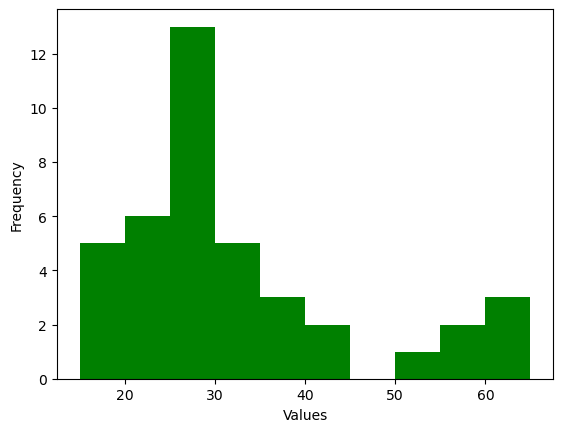

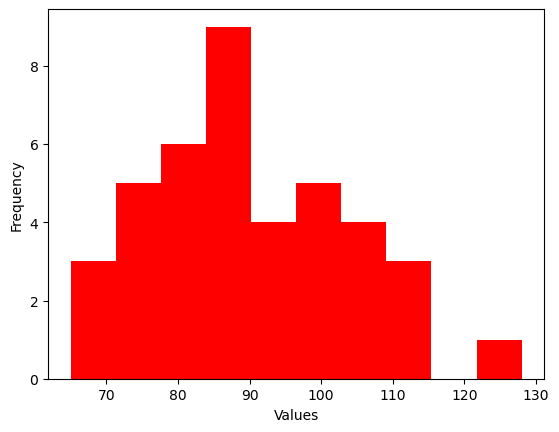

In [5]:
plot_hist(class_bag_count(classes_path, "benign"), "green")
plot_hist(class_bag_count(classes_path, "malignant"), "red")

## Images dimensions distribution

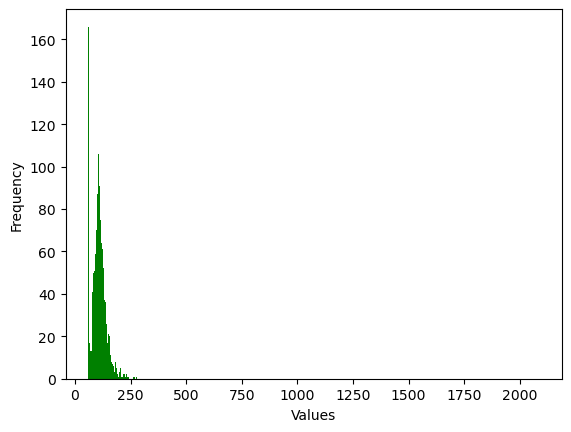

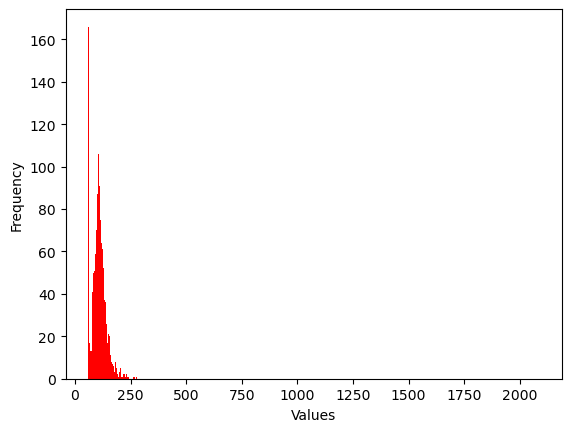

In [6]:
height_dict, width_dict = extract_image_dimensions(classes_path)
plot_bar(height_dict, "green")
plot_bar(width_dict, "red")

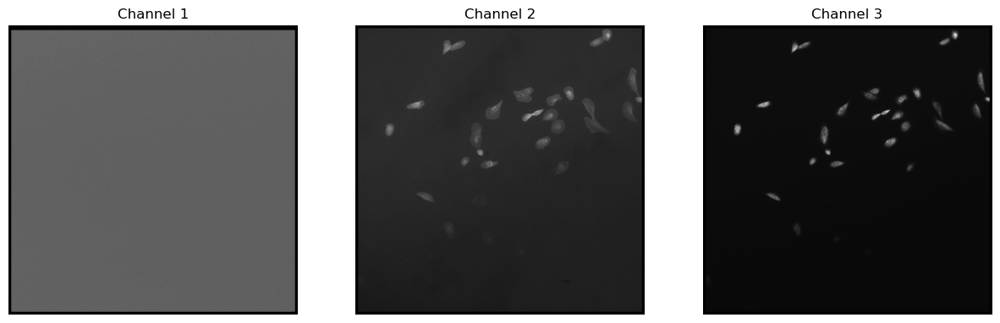

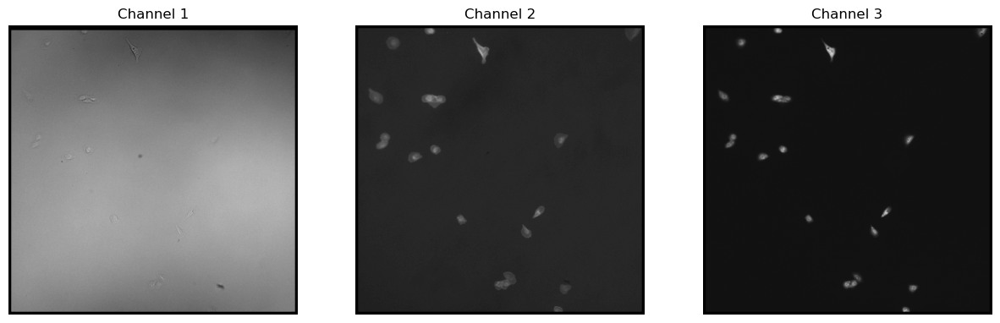

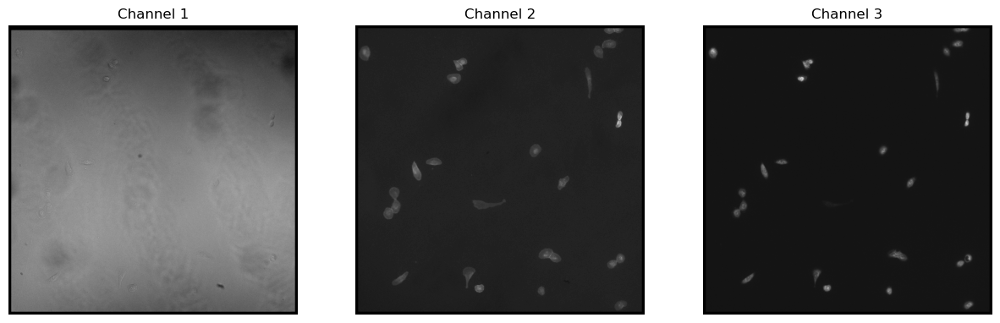

In [7]:
imagesAbove1000 = dimension_above_threshold(classes_path, 1000)
for image in imagesAbove1000:
    display_image(image)

## Cleaning non-cropped images


In [8]:
delete_images(imagesAbove1000)

File: ./data\train\train\benign\mcf10aCdExposed-34\mcf10aCdExposed-34_croppedCell_0.npy deleted
File: ./data\train\train\benign\mcf10aCdExposed-35\mcf10aCdExposed-35_croppedCell_0.npy deleted
File: ./data\train\train\benign\mcf10aCdExposed-40\mcf10aCdExposed-40_croppedCell_0.npy deleted


## Distributions after cleaning

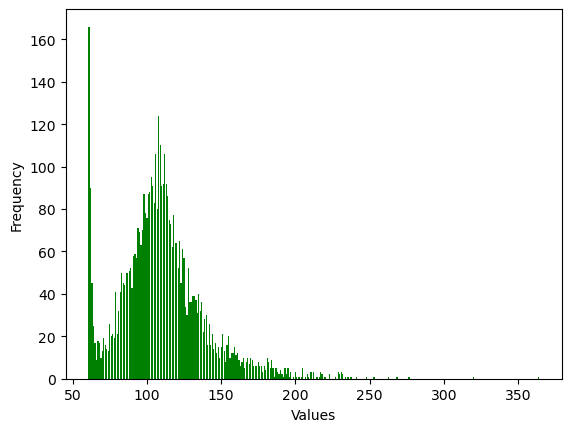

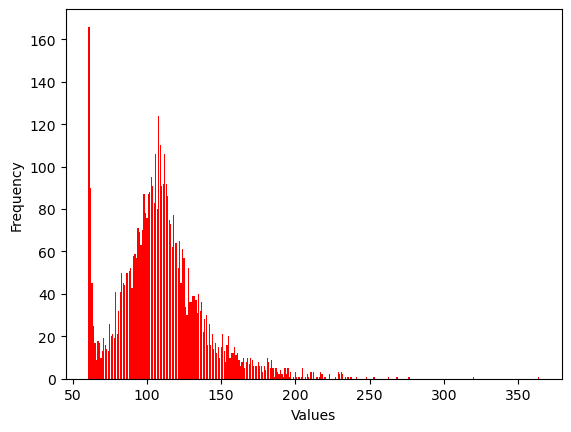

In [9]:
height_dict, width_dict = extract_image_dimensions(classes_path)
plot_bar(height_dict, "green")
plot_bar(width_dict, "red")

## Images visualization

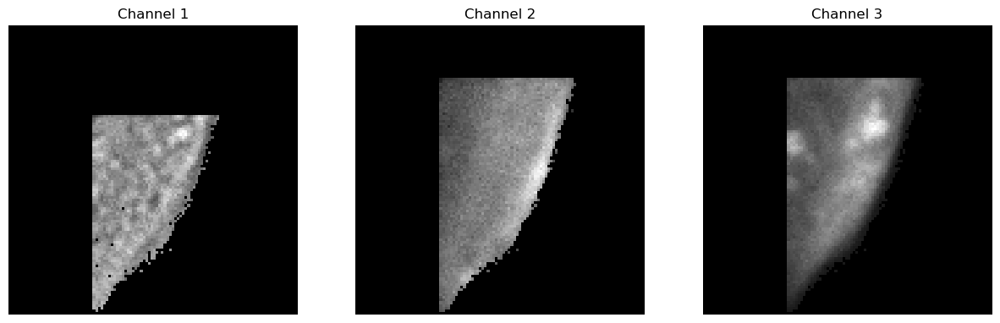

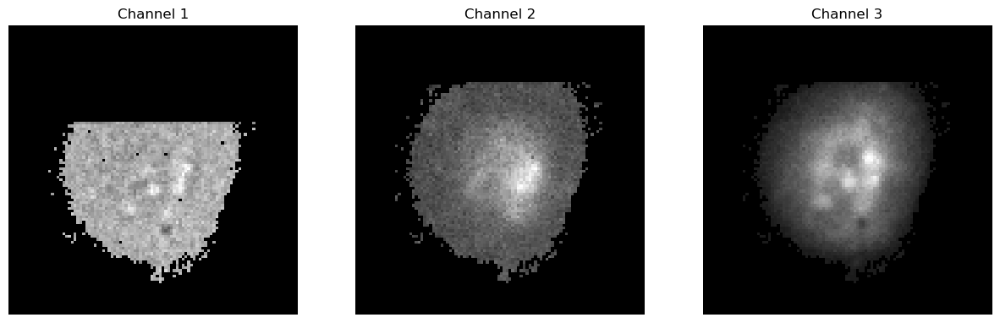

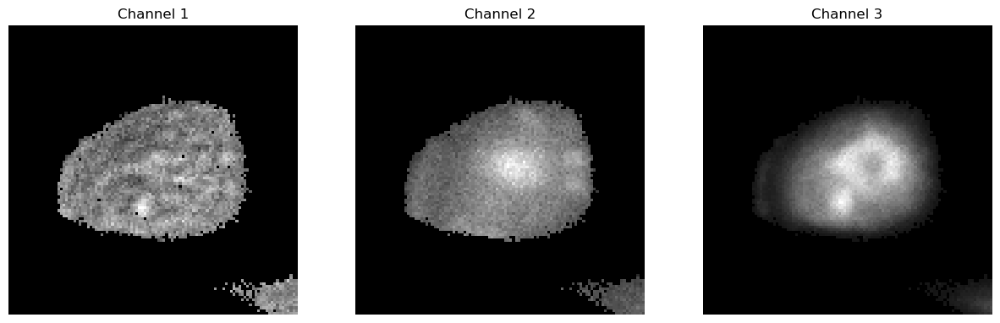

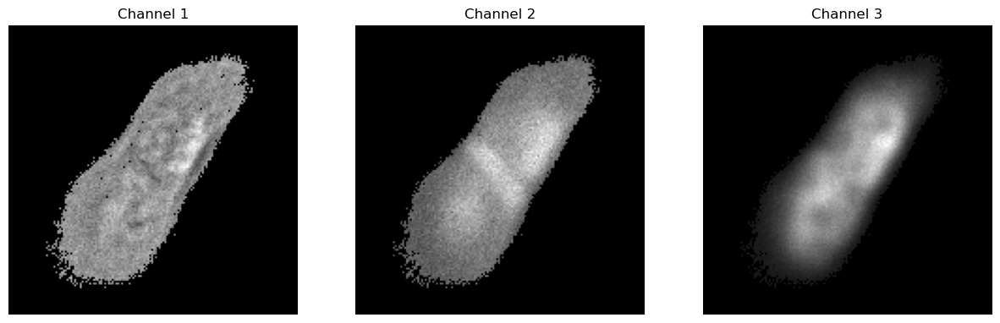

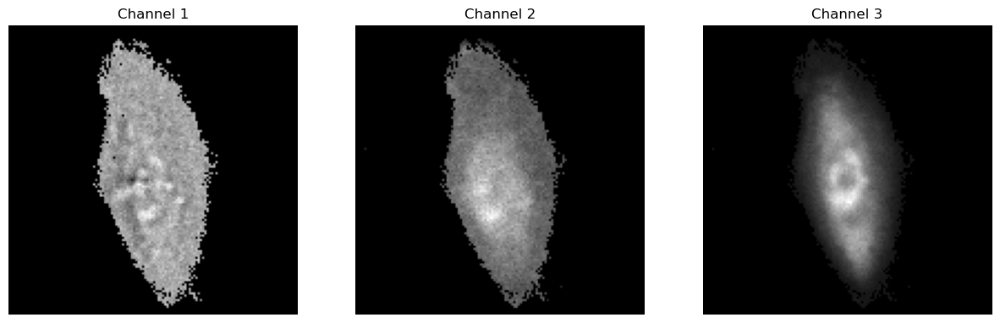

...

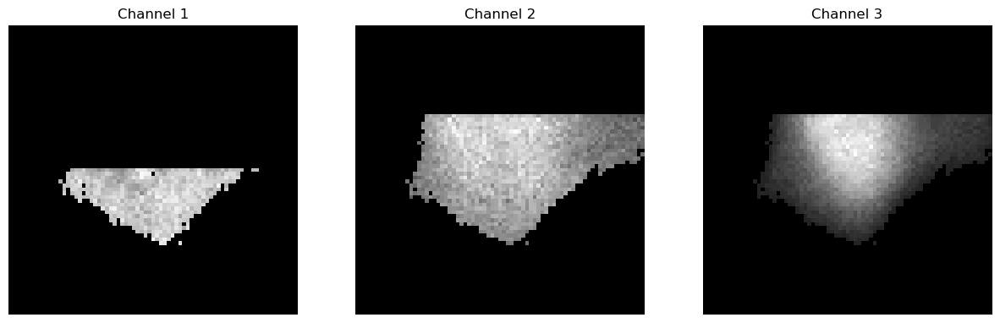

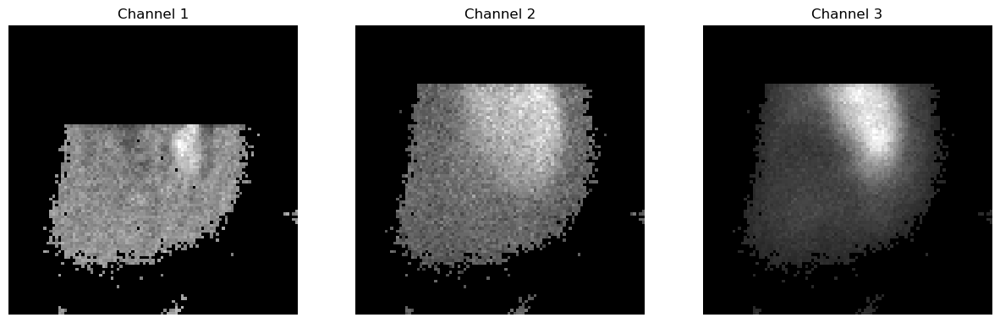

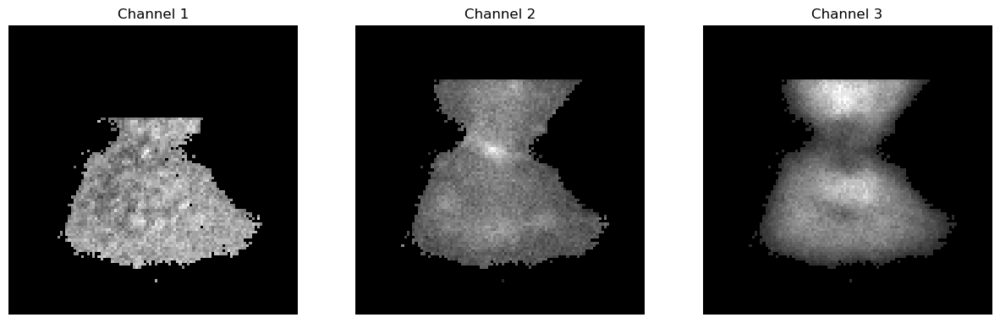

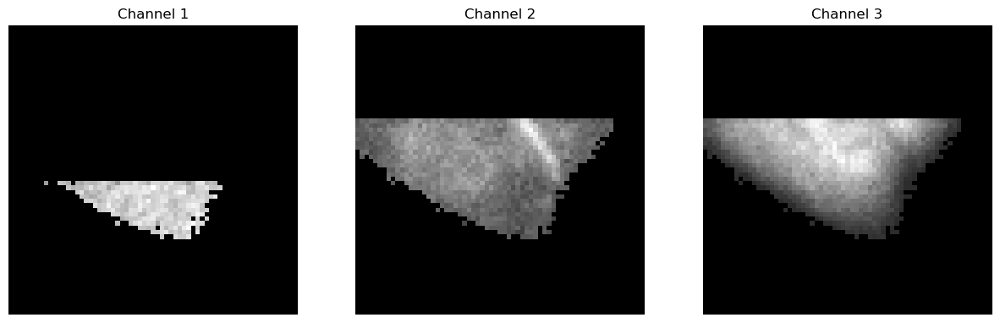

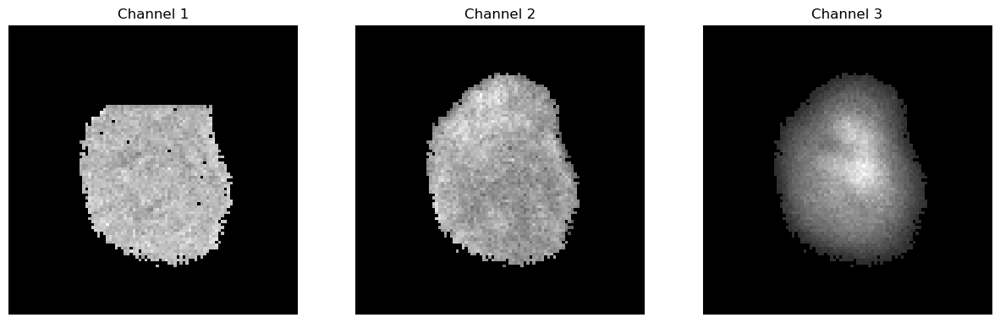

In [10]:
for root, dirs, files in os.walk(classes_path):
    if len(files) > 0:
        for i in range(2):
            display_image(os.path.join(root,files[i]))

        

# Stratified split

## Paths and folders for split

In [11]:
#Define paths
splitted_path = os.path.join(data_path, "splitted")
train_path = os.path.join(splitted_path, "train")
val_path = os.path.join(splitted_path, "validation")
test_path = os.path.join(splitted_path, "test")

#Create Folders
os.makedirs(splitted_path, exist_ok=True)
os.makedirs(train_path, exist_ok=True)
os.makedirs(val_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

## Functions for split

In [12]:
#Receives in input the Bag Name - Dimension, for every folder
def split_data(folder_counts, train_ratio=0.60, val_ratio=0.20, bins= 5, random_seed=1234):
    count_groups = defaultdict(list)
    for folder_name, count in folder_counts.items():
        #Aggregate creating bins every 5, for example 20, 21, 22, 23, 24 all in the same bin
        res = count % bins
        if res != 0:
            count = count - res + 5
        count_groups[count].append(folder_name)

    tot_train = []
    tot_val = []
    tot_test = []

    keys = list(count_groups.keys())
    random.seed(random_seed)
    random.shuffle(keys)

    for count in keys:
        folders = count_groups[count]
        n = len(folders)
        n_train = round(n * train_ratio)
        n_val = round(n * val_ratio)

        if n_train == 1:
            minimum = min(len(tot_train), len(tot_val), len(tot_test))
            if minimum == len(tot_train):
                tot_train += folders
            elif minimum == len(tot_val):
                tot_val += folders
            else:
                tot_test += folders
            continue

        train_folders, temp_folders = train_test_split(folders, train_size=n_train, random_state=random_seed)

        if (n_val == 0) or (n_val == len(temp_folders)):
            tot_train += train_folders
            if len(tot_val) < len(tot_test):
                tot_val += temp_folders
            else:
                tot_test += temp_folders
            continue

        val_folders, test_folders = train_test_split(temp_folders, train_size=n_val, random_state=random_seed)
        tot_train += train_folders
        tot_val += val_folders
        tot_test += test_folders


    return tot_train, tot_val, tot_test


def copy_folders(base_path, data, dest_path):
    for folder_name in data:
        src_folder = os.path.join(base_path, folder_name)
        dest_folder = os.path.join(dest_path, folder_name)
        if not os.path.exists(dest_path):
            os.makedirs(dest_path)
        shutil.copytree(src_folder, dest_folder)


def extract_files_to_root(root_folder):
    for dirpath, dirnames, filenames in os.walk(root_folder):
        if dirpath == root_folder:
            continue

        for file in filenames:
            src_path = os.path.join(dirpath, file)
            dst_path = os.path.join(root_folder, file)
            shutil.move(src_path, dst_path)

        if not os.listdir(dirpath):
            os.rmdir(dirpath)

## Split by path

In [13]:
# This code performs a stratified split on the dimensions of each folder for each class, based on the "train_ratio" and "val_ratio" parameters.
# It aggregates the folder dimensions into bins of size "bins."
# The algorithm attempts up to "max_iterations" iterations, in which it randomizes the split seed until it finds a split that satisfies the
# "val_test_diff" and "error_on_train_percentage_split" constraints.
# In practice, we are trying to achieve a stratified split on the folder dimensions while preserving balanced class ratios in each partition.
# The cardinality of each class in the test and validation partitions is constrained to be almost equal.
# Additionally, the classes in the training partition are constrained to match the ratio specified by "train_ratio" as closely as possible, using the "error_on_train_percentage_split" variable.


train_ratio = 0.60
val_ratio = 0.20
bins = 5
val_test_diff = 10
error_on_train_percentage_split = 60
total_malignant = 3619
total_benign = 1274
max_iterations = 5000


for class_name in ['benign', 'malignant']:
    base_path = os.path.join(classes_path, class_name)
    folderCountDict = get_file_counts(base_path)
    print("\nAll "+ str(len(folderCountDict)) + " " + class_name + " folders " + "with count of elements: \n", folderCountDict)
    
    random_seed = 0
    val_count = float("inf")
    test_count = 0
    train_count = 0
    while (random_seed <= max_iterations):
        val_count = 0
        test_count = 0
        train_count = 0
        train_data, val_data, test_data = split_data(folderCountDict, train_ratio=train_ratio, val_ratio=val_ratio, bins = bins, random_seed=random_seed)

        for folder_val in val_data:
            val_count += count_files_in_folder(os.path.join(base_path, folder_val))

        for folder_test in test_data:
            test_count += count_files_in_folder(os.path.join(base_path, folder_test))

        for folder_train in train_data:
            train_count += count_files_in_folder(os.path.join(base_path, folder_train))
 
        if abs(val_count-test_count) <= val_test_diff:
            if class_name == "benign":
                if abs((total_benign*(train_ratio))-train_count) < error_on_train_percentage_split:
                    break
            else:
                if abs((total_malignant*(train_ratio))-train_count) < error_on_train_percentage_split:
                    break

        
        random_seed += 1


    print(train_count, val_count, test_count)
    print("\n")
    print(str(len(train_data)) + " folders for training:", train_data)
    print(str(len(val_data)) + " folders for validation:", val_data)
    print(str(len(test_data)) + " folders for test:", test_data)
    print("\n")
    print("\n")
    copy_folders(base_path, train_data, os.path.join(train_path, class_name))
    copy_folders(base_path, val_data, os.path.join(val_path, class_name))
    copy_folders(base_path, test_data, os.path.join(test_path, class_name))

    


All 40 benign folders with count of elements: 
 {'mcf10aCdExposed-01': 50, 'mcf10aCdExposed-02': 62, 'mcf10aCdExposed-03': 29, 'mcf10aCdExposed-04': 28, 'mcf10aCdExposed-05': 35, 'mcf10aCdExposed-06': 28, 'mcf10aCdExposed-07': 19, 'mcf10aCdExposed-08': 40, 'mcf10aCdExposed-09': 30, 'mcf10aCdExposed-10': 29, 'mcf10aCdExposed-11': 29, 'mcf10aCdExposed-12': 23, 'mcf10aCdExposed-13': 23, 'mcf10aCdExposed-14': 34, 'mcf10aCdExposed-15': 37, 'mcf10aCdExposed-16': 62, 'mcf10aCdExposed-17': 65, 'mcf10aCdExposed-18': 42, 'mcf10aCdExposed-19': 58, 'mcf10aCdExposed-20': 57, 'mcf10aCdExposed-21': 27, 'mcf10aCdExposed-22': 34, 'mcf10aCdExposed-23': 21, 'mcf10aCdExposed-24': 31, 'mcf10aCdExposed-25': 27, 'mcf10aCdExposed-26': 34, 'mcf10aCdExposed-27': 20, 'mcf10aCdExposed-28': 27, 'mcf10aCdExposed-29': 18, 'mcf10aCdExposed-30': 27, 'mcf10aCdExposed-31': 26, 'mcf10aCdExposed-32': 15, 'mcf10aCdExposed-33': 24, 'mcf10aCdExposed-34': 24, 'mcf10aCdExposed-35': 15, 'mcf10aCdExposed-36': 19, 'mcf10aCdExpos

## Splits summarization

In [14]:
summarize_dataset(splitted_path, train_path, val_path, test_path)

All Data folders: 
Folder: test, Number of files: 1001
Folder: train, Number of files: 2900
Folder: validation, Number of files: 992

Files in train folder: 

Folder: benign, Number of files: 726
Folder: malignant, Number of files: 2174

Files in validation folder: 

Folder: benign, Number of files: 274
Folder: malignant, Number of files: 718

Files in test folder: 

Folder: benign, Number of files: 274
Folder: malignant, Number of files: 727


## Percentage of the minority class in each split

In [15]:
train = 726/2900
train

0.2503448275862069

In [16]:
validation = 274/992
validation

0.2762096774193548

In [17]:
test = 274/1001
test

0.27372627372627373

## Bags dimensions distribution after split

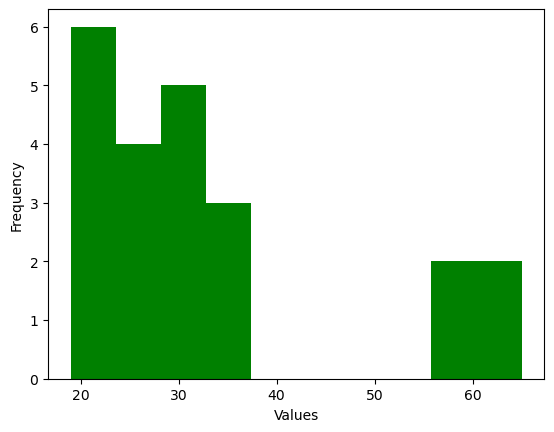

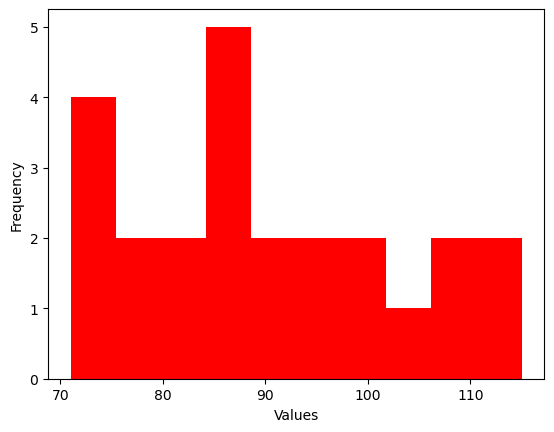

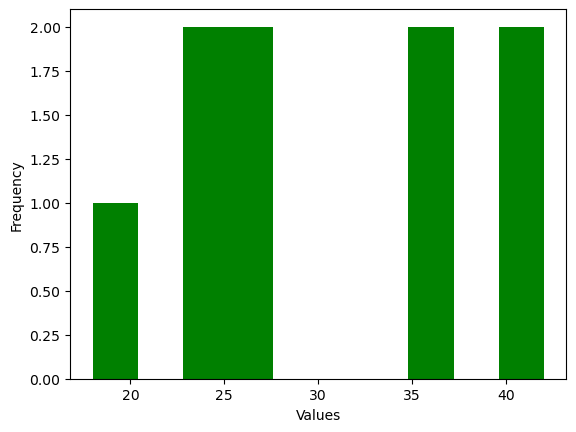

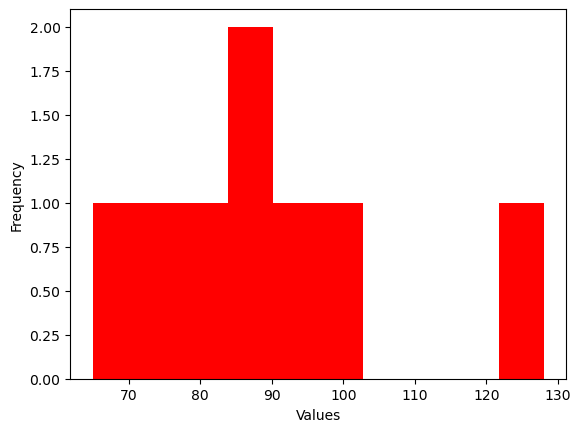

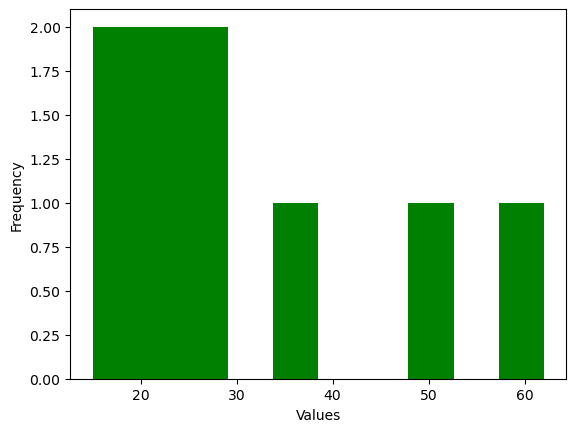

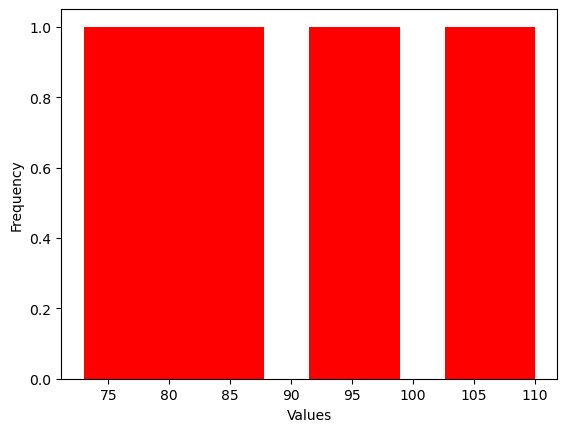

In [18]:
plot_hist(class_bag_count(train_path, "benign"), "green")
plot_hist(class_bag_count(train_path, "malignant"), "red")

plot_hist(class_bag_count(val_path, "benign"), "green")
plot_hist(class_bag_count(val_path, "malignant"), "red")

plot_hist(class_bag_count(test_path, "benign"), "green")
plot_hist(class_bag_count(test_path, "malignant"), "red")

## Extracting files inside bag folders

In [19]:
extract_files_to_root(os.path.join(train_path, "benign"))
extract_files_to_root(os.path.join(train_path, "malignant"))
extract_files_to_root(os.path.join(val_path, "benign"))
extract_files_to_root(os.path.join(val_path, "malignant"))
extract_files_to_root(os.path.join(test_path, "benign"))
extract_files_to_root(os.path.join(test_path, "malignant"))